In [2]:
library(Seurat)
library(patchwork)
library(tidyverse) 
library(ggplot2)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


── Attaching core tidyverse packages ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.3.0
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [3]:
BiocManager::install("SingleR")
BiocManager::install("celldex")
BiocManager::install("SingleCellExperiment")

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cloud.r-project.org

Bioconductor version 3.19 (BiocManager 1.30.26), R 4.4.1 (2024-06-14)

Warning message:
“package(s) not installed when version(s) same as or greater than current; use
  `force = TRUE` to re-install: 'SingleR'”
Old packages: 'ade4', 'ape', 'aplot', 'AUCell', 'Banksy', 'bedr',
  'BiocFileCache', 'bookdown', 'broom', 'bslib', 'Cairo', 'caret', 'ccTensor',
  'CelliD', 'checkmate', 'cicero', 'ClassDiscovery', 'clock', 'cowplot',
  'crosstalk', 'crul', 'cubature', 'curl', 'data.tree', 'dbscan', 'dendextend',
  'DescTools', 'dials', 'doBy', 'doFuture', 'emmeans', 'FactoMineR',
  'fastDummies', 'fields', 'fitdistrplus', 'flexmix', 'FlexParamCurve', 'FSA',
  'fstcore', 'future', 'future.apply', 'gam', 'gamlss', 'gert', 'GGally',
  'gganimate', 'ggforce', 'ggfortify', 'ggfun', 'ggnewscale', 'ggpubr',
  

In [4]:
library(SingleR)
library(celldex)
library(SingleCellExperiment)

set.seed(1234)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, 

In [5]:
sessionInfo()

R version 4.4.1 (2024-06-14)
Platform: x86_64-pc-linux-gnu
Running under: Ubuntu 22.04.5 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/atlas/libblas.so.3.10.3 
LAPACK: /usr/lib/x86_64-linux-gnu/atlas/liblapack.so.3.10.3;  LAPACK version 3.10.0

locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

time zone: Etc/UTC
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] SingleCellExperiment_1.26.0 celldex_1.14.0             
 [3] SingleR_2.6.0               SummarizedExperiment_1.34.0
 [5] Biobase_2.64.0              GenomicRanges_1.56.2       
 [7] GenomeInfoDb_1.40.1         IRanges_2.38.1             


In [6]:
# Define directories
dir_fig <- "../../results/sc_rna/06_01_overall/figures"
dir_int <- "../../results/sc_rna/06_01_overall/intermediate"

# Make sure directories exist
dir.create(dir_fig, recursive = TRUE, showWarnings = FALSE)
dir.create(dir_int, recursive = TRUE, showWarnings = FALSE)

# 1. Preprocessing

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


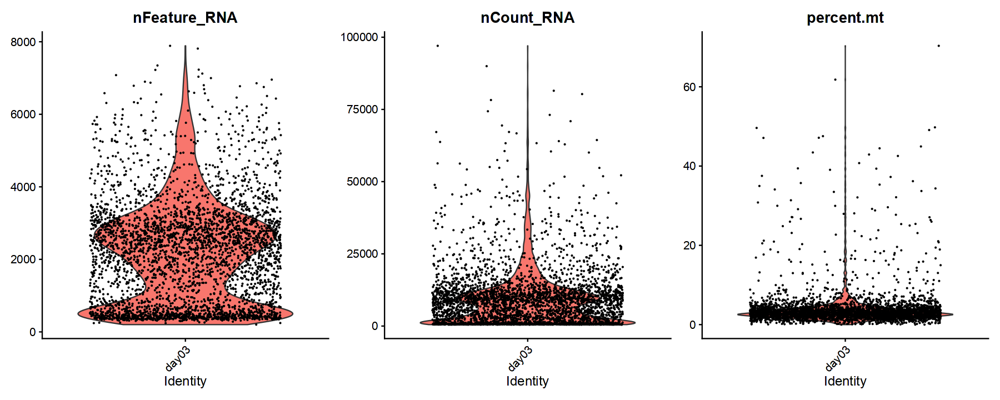

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


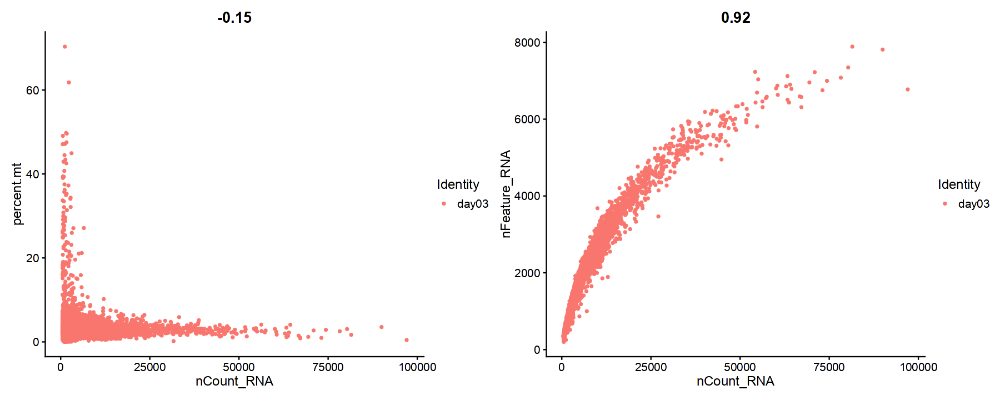

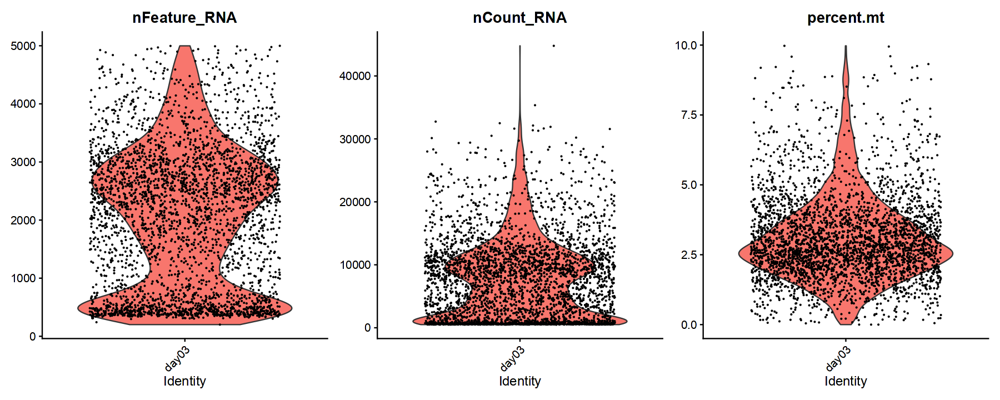

In [7]:
data_dir3 <- "../../data/scRNA/A1_B16_day_3/filtered_feature_bc_matrix"
expression_matrix3 <- Read10X(data.dir=data_dir3)

day3 <- CreateSeuratObject(counts = expression_matrix3, project = "day03", min.cells = 3, min.features = 200)
day3[["percent.mt"]] <- PercentageFeatureSet(day3, pattern = "mt-")

options(repr.plot.width = 15, repr.plot.height = 6)
VlnPlot(day3, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

plot1 <- FeatureScatter(day3, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(day3, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2

day3 <- subset(day3, subset = nFeature_RNA > 200 & nFeature_RNA <5000 & percent.mt < 10)
VlnPlot(day3, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


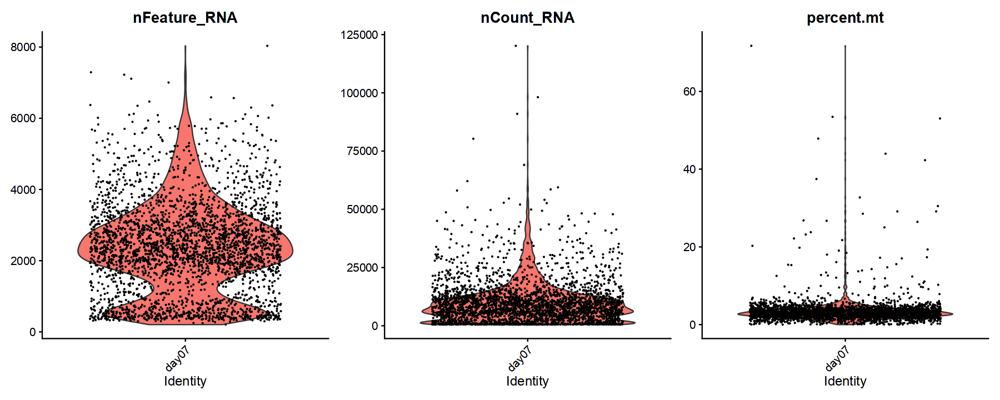

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


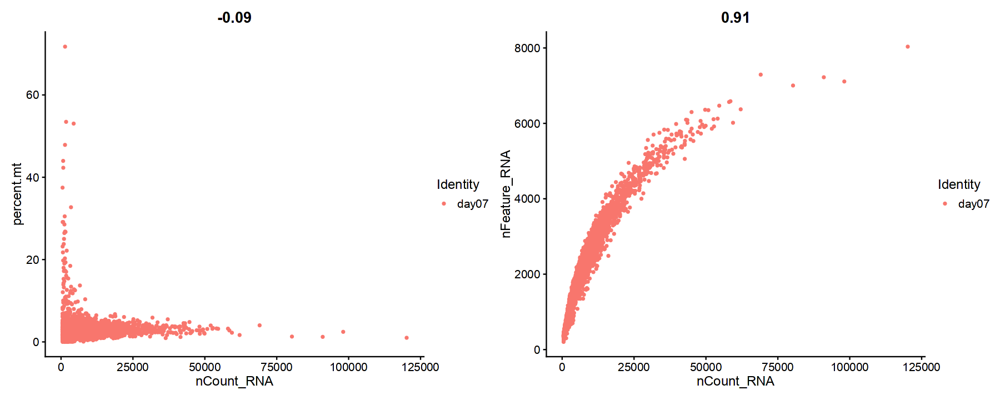

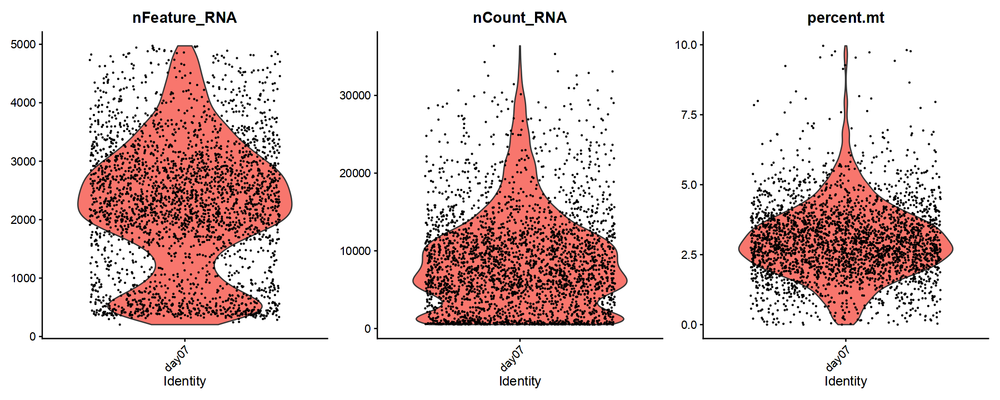

In [8]:
data_dir7 <- "../../data/scRNA/A2_B16_day_7/filtered_feature_bc_matrix"
expression_matrix7 <- Read10X(data.dir=data_dir7)
day7 <- CreateSeuratObject(counts = expression_matrix7, project = "day07", 
                           min.cells = 3, min.features = 200)
day7[["percent.mt"]] <- PercentageFeatureSet(day7, pattern = "mt-")

options(repr.plot.width = 15, repr.plot.height = 6)
VlnPlot(day7, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

plot1 <- FeatureScatter(day7, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(day7, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2

day7 <- subset(day7, subset = nFeature_RNA > 200 & nFeature_RNA <5000 & percent.mt < 10)
VlnPlot(day7, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


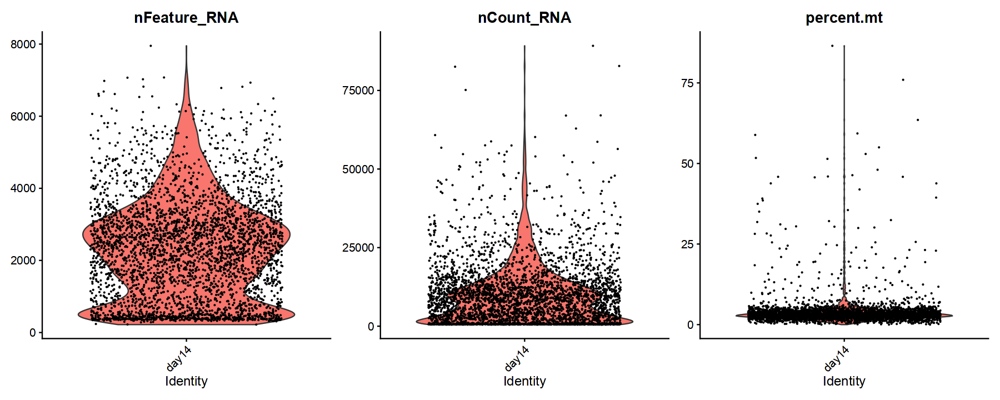

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


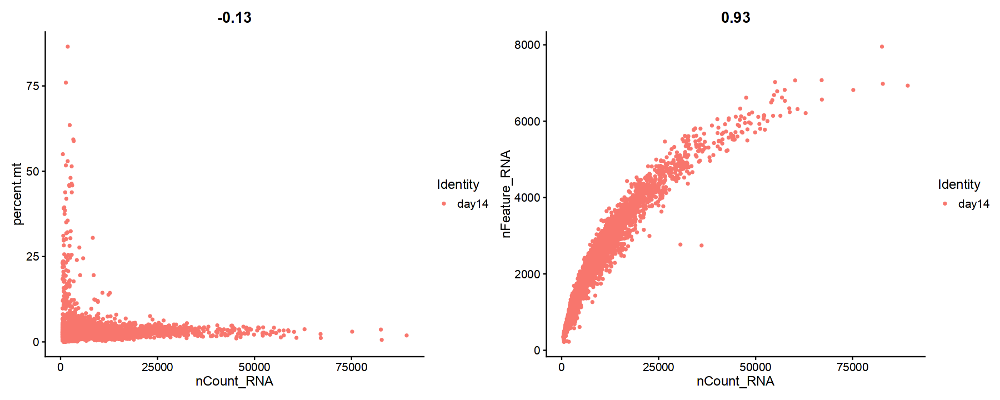

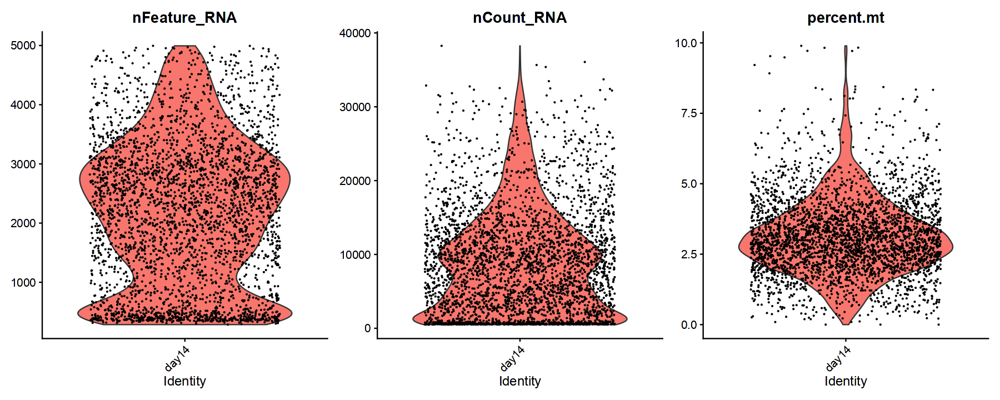

In [9]:
data_dir14 <- "../../data/scRNA/A3_B16_day_14/filtered_feature_bc_matrix"
expression_matrix14 <- Read10X(data.dir=data_dir14)

day14 <- CreateSeuratObject(counts = expression_matrix14, project = "day14", 
                            min.cells = 3, min.features = 200)
day14[["percent.mt"]] <- PercentageFeatureSet(day14, pattern = "mt-")

options(repr.plot.width = 15, repr.plot.height = 6)
VlnPlot(day14, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

plot1 <- FeatureScatter(day14, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(day14, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2

day14 <- subset(day14, subset = nFeature_RNA > 200 & nFeature_RNA <5000 & percent.mt < 10)
VlnPlot(day14, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [10]:
dir.create(file.path(dir_int, "01_filtered"), showWarnings = FALSE, recursive = TRUE)
saveRDS(day3, file = file.path(dir_int, "01_filtered", "day3_qc_filtered.rds"))
saveRDS(day7, file = file.path(dir_int, "01_filtered", "day7_qc_filtered.rds"))
saveRDS(day14, file = file.path(dir_int, "01_filtered", "day14_qc_filtered.rds"))

# 2. Integration

In [11]:
day3$day <- "Day3"
day7$day <- "Day7"
day14$day <- "Day14"

In [12]:
merged <- merge(day3, y = list(day7, day14), add.cell.ids = c("Day3", "Day7", "Day14"))
merged$day <- factor(merged$day, levels = c("Day3", "Day7", "Day14"))

In [13]:
merged

An object of class Seurat 
16245 features across 9527 samples within 1 assay 
Active assay: RNA (16245 features, 0 variable features)
 3 layers present: counts.day03, counts.day07, counts.day14

In [14]:
merged <- NormalizeData(merged)
merged <- FindVariableFeatures(merged, selection.method = "vst", nfeatures = 2000)

Normalizing layer: counts.day03

Normalizing layer: counts.day07

Normalizing layer: counts.day14

Finding variable features for layer counts.day03

Finding variable features for layer counts.day07

Finding variable features for layer counts.day14



In [15]:
merged

An object of class Seurat 
16245 features across 9527 samples within 1 assay 
Active assay: RNA (16245 features, 2000 variable features)
 6 layers present: counts.day03, counts.day07, counts.day14, data.day03, data.day07, data.day14

In [16]:
merged <- ScaleData(merged)
merged <- RunPCA(merged)

Centering and scaling data matrix

PC_ 1 
Positive:  Nkg7, Ptprcap, Ms4a4b, Gimap4, Il2rb, Gimap6, Lck, Sh2d2a, Cd2, Sept1 
	   Trbc2, Trbc1, Gimap3, Skap1, Ctla2a, Ctsw, AW112010, Cd3g, H2-Q7, Gimap1 
	   Cd3d, Ets1, Ptpn22, Ccl5, Gimap5, Trac, Ltb, Klrd1, Cd3e, Ablim1 
Negative:  Ifitm3, Lgals3, Psap, Ftl1, Cd14, Il1b, Lyz2, Ms4a6c, Ifi204, Ctsc 
	   Fcgr1, Cdkn1a, Ifitm2, Cybb, Wfdc17, Ctsb, Plaur, Fcgr2b, Ccr1, Slc15a3 
	   Prdx5, Gda, Ccl6, Cstb, Marcks, Csf2rb, Ms4a6d, Msr1, Ninj1, Tgfbi 
PC_ 2 
Positive:  S100a8, S100a9, Clec4d, Ankrd33b, Hcar2, G0s2, Cxcl2, Cd9, Tnfrsf23, Hdc 
	   Egr1, Ccl3, Mirt1, E230032D23Rik, Slc7a11, Mirt2, Grina, Hilpda, Cxcl3, Egln3 
	   Arg2, Ier3, Gadd45a, Fth1, Retnlg, Smox, Slpi, Fnip2, Acod1, Rhov 
Negative:  Syngr2, Crip1, Hsp90ab1, Ptma, H2-DMa, Ifi30, H2-DMb1, H2afz, Fdps, Napsa 
	   Rps27l, Naaa, Cst3, Cd74, Ptms, Ranbp1, Tuba1b, Rps2, Rnase6, Pld4 
	   Ccnd1, Ly86, H2-Aa, Pmvk, Cbfa2t3, H2-Ab1, Ciita, Pkib, Ran, H2-Eb1 
PC_ 3 
Positive:  Gapdh

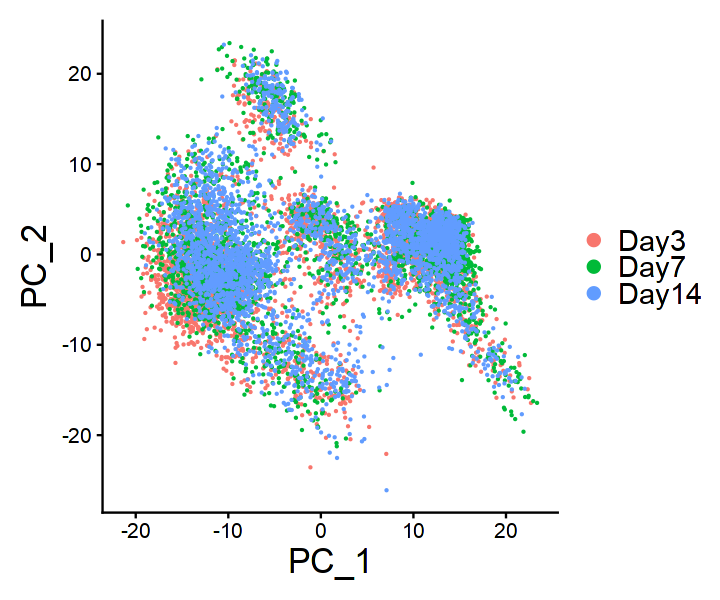

In [17]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(merged, reduction = "pca", group.by = "day") + theme(text = element_text(size = 20)) + ggtitle(NULL)

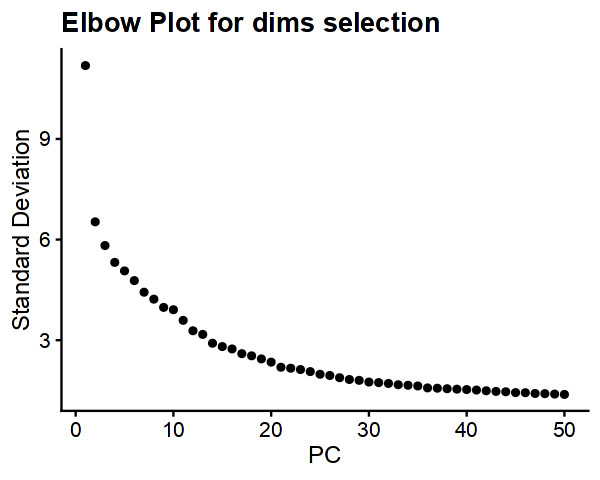

In [18]:
options(repr.plot.width = 5, repr.plot.height = 4)
ElbowPlot(merged, ndims = 50) + ggtitle("Elbow Plot for dims selection")

In [19]:
merged <- JoinLayers(merged)

In [20]:
dir.create(file.path(dir_int, "02_integration"), showWarnings = FALSE, recursive = TRUE)
saveRDS(merged, file = file.path(dir_int, "02_integration", "merged_pca.rds"))

# 3. Overall Clustering

In [21]:
merged <- readRDS(file.path(dir_int, "02_integration", "merged_pca.rds"))

In [22]:
merged <- FindNeighbors(merged, dims = 1:50, reduction = "pca")
merged <- FindClusters(merged, resolution = 0.1, cluster.name = "unintegrated_clusters")
merged <- RunUMAP(merged, reduction = "pca", dims = 1:50)
merged <- RunTSNE(merged, reduction = "pca", dims = 1:50)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 9527
Number of edges: 375107

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9738
Number of communities: 9
Elapsed time: 0 seconds


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
02:56:53 UMAP embedding parameters a = 0.9922 b = 1.112

02:56:53 Read 9527 rows and found 50 numeric columns

02:56:53 Using Annoy for neighbor search, n_neighbors = 30

02:56:53 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

02:56:54 Writing NN index file to temp file /tmp/RtmpwqZzyB/file522f5b9396a5

02:56:54 Searching Annoy index using 1 thread, search_k = 3000

02:56:56 Annoy recall = 100%

02:56:58 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors =

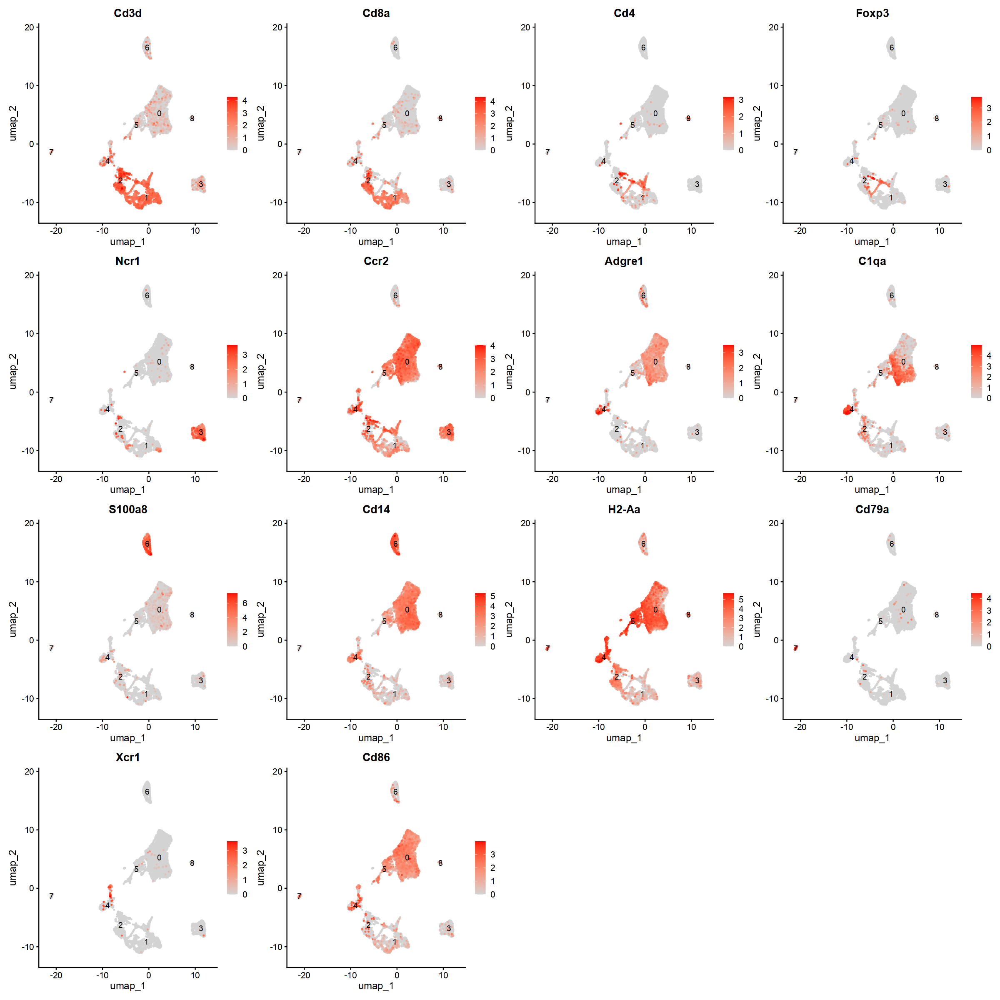

In [23]:
cluster_specific_genes1 <- c("Cd3d", "Cd8a", "Cd4", "Foxp3", "Ncr1", "Ccr2", "Adgre1",  "C1qa", "S100a8", "Cd14", "H2-Aa", "Cd79a", "Xcr1", "Cd86")

options(repr.plot.width = 20, repr.plot.height = 20)
FeaturePlot(merged, features = cluster_specific_genes1, pt.size=0.3, label=T, order=T, ncol=4, cols = c("lightgrey", "red"))

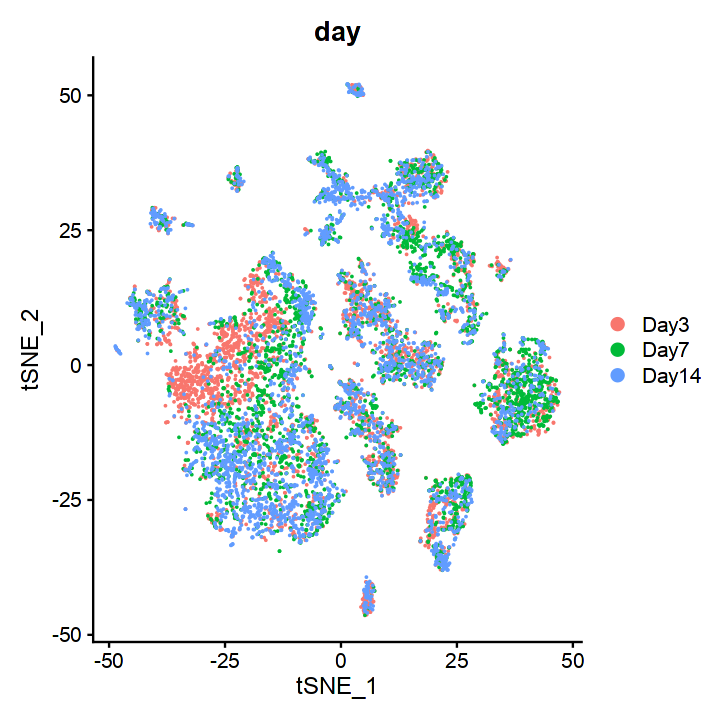

In [24]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(merged, reduction = "tsne", group.by = "day", pt.size=0.01)

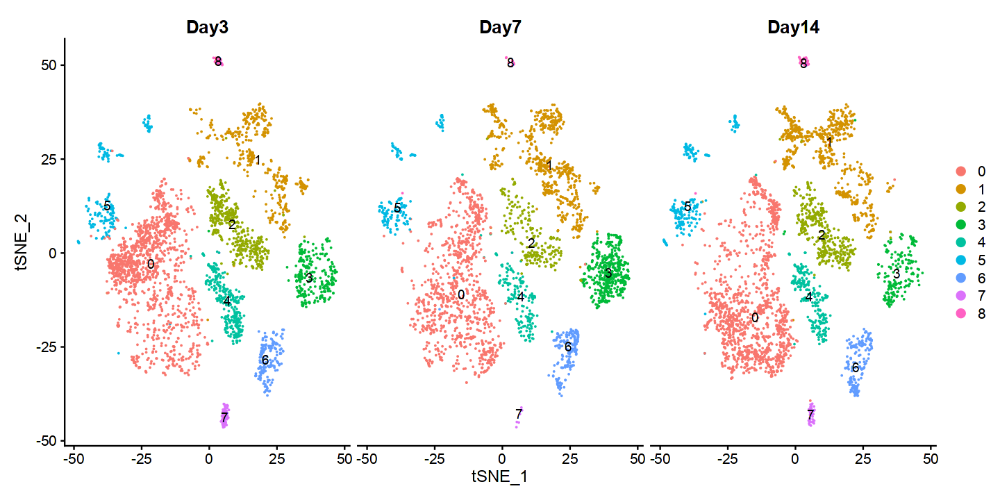

In [25]:
options(repr.plot.width = 12, repr.plot.height = 6)
DimPlot(merged, reduction = "tsne", split.by = "day",pt.size=0.01, label=T) + theme(strip.text = element_text(size = 15)) 

In [26]:
dir.create(file.path(dir_int, "03_clustering"), showWarnings = FALSE, recursive = TRUE)
saveRDS(merged, file = file.path(dir_int, "03_clustering", "merged_pca.rds"))

# 4. SingleR

In [27]:
ref <- celldex::ImmGenData()  # Mouse
head(ref)

class: SummarizedExperiment 
dim: 6 830 
metadata(0):
assays(1): logcounts
rownames(6): Zglp1 Vmn2r65 ... Ldlrap1 Mdn1
rowData names(0):
colnames(830):
  GSM1136119_EA07068_260297_MOGENE-1_0-ST-V1_MF.11C-11B+.LU_1.CEL
  GSM1136120_EA07068_260298_MOGENE-1_0-ST-V1_MF.11C-11B+.LU_2.CEL ...
  GSM920654_EA07068_201214_MOGENE-1_0-ST-V1_TGD.VG4+24ALO.E17.TH_1.CEL
  GSM920655_EA07068_201215_MOGENE-1_0-ST-V1_TGD.VG4+24ALO.E17.TH_2.CEL
colData names(3): label.main label.fine label.ont

In [28]:
expr_mat <- GetAssayData(merged, assay = "RNA", layer = "data")
labels = ref$label.main

# SingleR
SingleR_results <- SingleR(
    test = expr_mat,
    ref = ref,
    labels= ref$label.main
)

merged$SingleR_results <- SingleR_results$labels

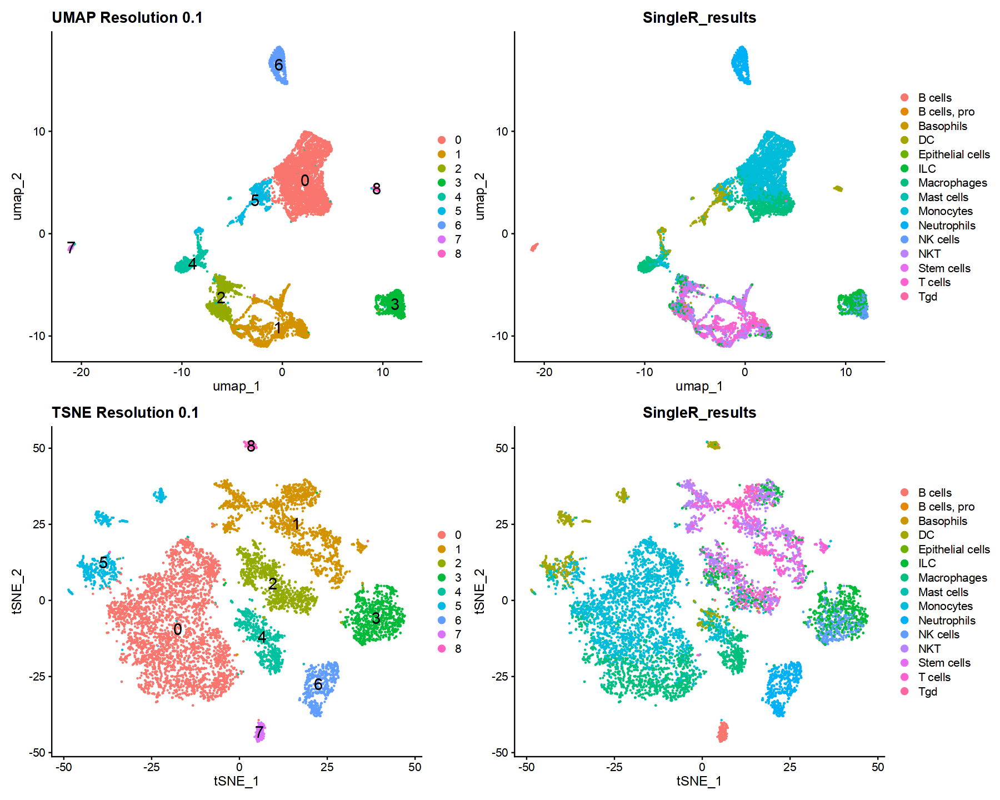

In [29]:
options(repr.plot.width = 15, repr.plot.height = 12)
p1 <- DimPlot(merged, label.size = 6, label=TRUE)+ ggtitle("UMAP Resolution 0.1")
p2 <- DimPlot(merged, label.size = 6, reduction = "tsne", label=TRUE)+ ggtitle("TSNE Resolution 0.1")
p3 <- DimPlot(merged, group.by = 'SingleR_results', label = FALSE, label.size = 6)+ ggtitle("SingleR_results")
p4 <- DimPlot(merged, group.by = 'SingleR_results', reduction = "tsne", label = FALSE, label.size = 6)+ ggtitle("SingleR_results")

(p1+p3)/(p2+p4)

In [30]:
dir.create(file.path(dir_int, "04_SingleR"), showWarnings = FALSE, recursive = TRUE)
saveRDS(merged, file = file.path(dir_int, "04_SingleR", "merged_pca.rds"))

# 5. Marker Gene

In [31]:
merged <- readRDS(file.path(dir_int, "04_SingleR", "merged_pca.rds"))

In [32]:
all_markers <- FindAllMarkers(
  merged,
  only.pos = TRUE,
  min.pct = 0.25,
  logfc.threshold = 0.25
)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



In [33]:
all_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10

In [34]:
head(top10)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,2.710457,0.905,0.088,0,0,Csf1r
0,3.128337,0.903,0.117,0,0,Ifi204
0,3.672904,0.858,0.075,0,0,Fcgr1
0,3.130700,0.860,0.081,0,0,Mafb
0,2.359875,0.966,0.189,0,0,Fcgr3
0,2.700702,0.945,0.168,0,0,Cybb


Warning message in DoHeatmap(merged, features = top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: Elof1, Mrps12, Polr2c, Rpl14, App, Fcgr3, Csf1r”


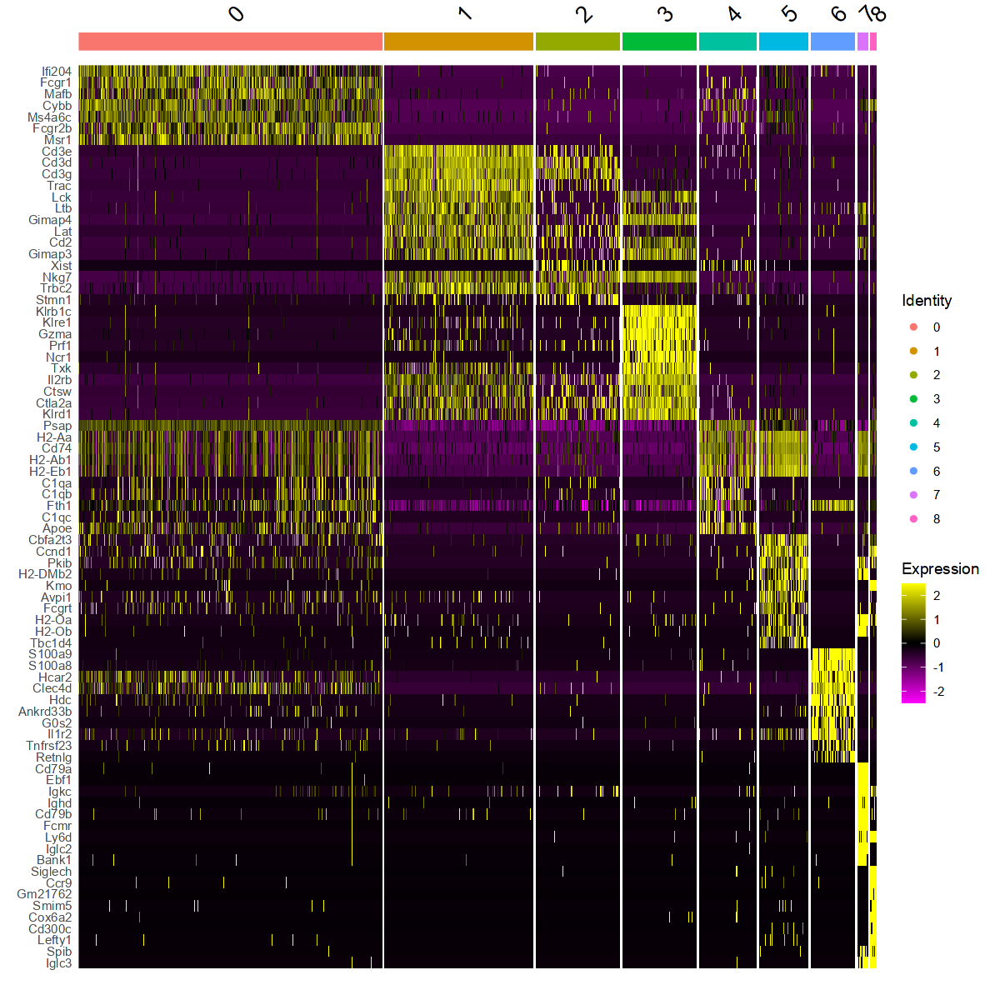

In [35]:
options(repr.plot.width = 10, repr.plot.height = 10)
DoHeatmap(merged, features = top10$gene)

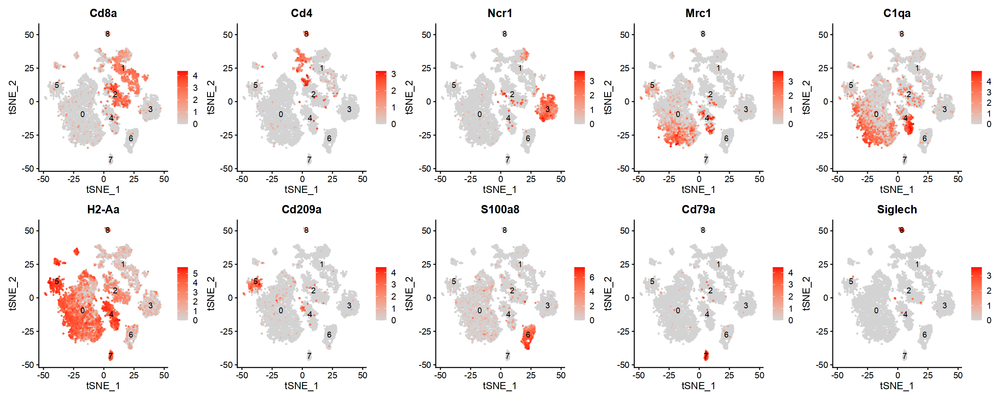

In [36]:
cluster_specific_genes1 <- c("Cd8a", "Cd4", "Ncr1", "Mrc1", "C1qa", "H2-Aa", "Cd209a","S100a8", "Cd79a", "Siglech")

options(repr.plot.width = 20, repr.plot.height = 8)
FeaturePlot(merged, features = cluster_specific_genes1, reduction = "tsne", pt.size=0.3, label=T, order=T, ncol=5, cols = c("lightgrey", "red"))

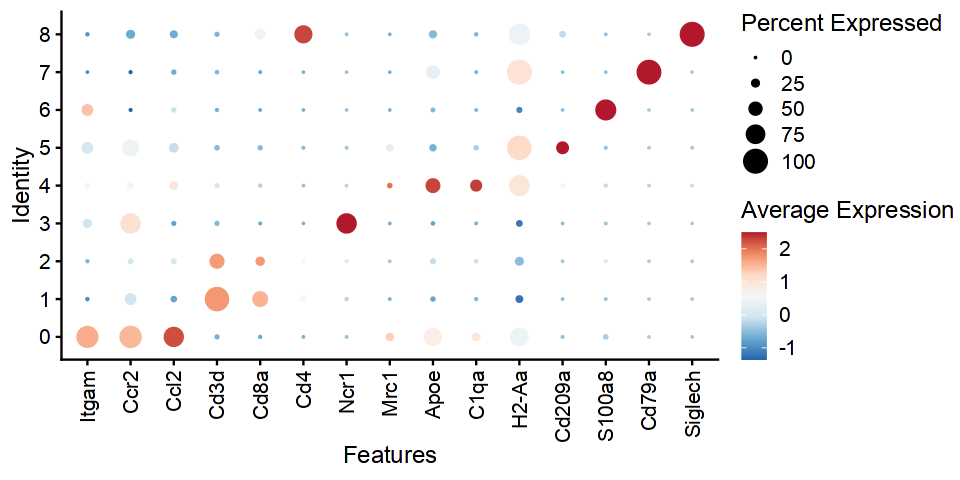

In [37]:
options(repr.plot.width = 8, repr.plot.height = 4)
cluster_specific_genes2 <- c("Itgam","Ccr2", "Ccl2", "Cd3d", "Cd8a", "Cd4","Ncr1", "Mrc1" ,"Apoe", 
                             "C1qa","H2-Aa", "Cd209a","S100a8", "Cd79a", "Siglech")
DotPlot(merged, features = cluster_specific_genes2, cols = "RdBu") + theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1))

# 6. Marker Annotation

In [38]:
merged <- readRDS(file.path(dir_int, "04_SingleR", "merged_pca.rds"))

In [39]:
table(Idents(merged))


   0    1    2    3    4    5    6    7    8 
3695 1820 1031  911  705  606  546  129   84 

In [40]:
# manual annotation           0                   1     2        3         4          5          6                       7     8  
cluster_annotations <- c("MDSC", "T", "T", "NK", "TAM", "cDC", "Neutrophil", "B", "pDC")
names(cluster_annotations) <- levels(merged)

merged <- RenameIdents(merged, cluster_annotations) 

In [41]:
dir.create(file.path(dir_int, "06_annotation"), showWarnings = FALSE, recursive = TRUE)
saveRDS(merged, file = file.path(dir_int, "06_annotation", "merged_pca.rds"))

In [42]:
table(Idents(merged))


      MDSC          T         NK        TAM        cDC Neutrophil          B 
      3695       2851        911        705        606        546        129 
       pDC 
        84 

## Visualization

In [43]:
merged <- readRDS(file.path(dir_int, "06_annotation", "merged_pca.rds"))

In [44]:
celltype_markers <- FindAllMarkers(merged, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster MDSC

Calculating cluster T

Calculating cluster NK

Calculating cluster TAM

Calculating cluster cDC

Calculating cluster Neutrophil

Calculating cluster B

Calculating cluster pDC



In [45]:
celltype_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 10) %>%
    ungroup() ->  top_markers_aggregate

In [46]:
cluster_colors <- RColorBrewer::brewer.pal(n = length(levels(merged$seurat_clusters)), "Set1")
names(cluster_colors) <- levels(merged$seurat_clusters)

In [47]:
cluster_colors 

0         1         2         3         4         5         6         7 
"#E41A1C" "#377EB8" "#4DAF4A" "#984EA3" "#FF7F00" "#FFFF33" "#A65628" "#F781BF" 
        8 
"#999999"

In [48]:
# DimPlot color
cluster_colors <- RColorBrewer::brewer.pal(n = length(levels(merged$seurat_clusters)), "Set1")
cluster_colors

[1] "#E41A1C" "#377EB8" "#4DAF4A" "#984EA3" "#FF7F00" "#FFFF33" "#A65628"
[8] "#F781BF" "#999999"

In [49]:
merged

An object of class Seurat 
16245 features across 9527 samples within 1 assay 
Active assay: RNA (16245 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 3 dimensional reductions calculated: pca, umap, tsne

## Fig. a

Warning message in DoHeatmap(merged, features = top_markers_aggregate$gene, slot = "scale.data", :
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: App, Fcgr3, Csf1r”


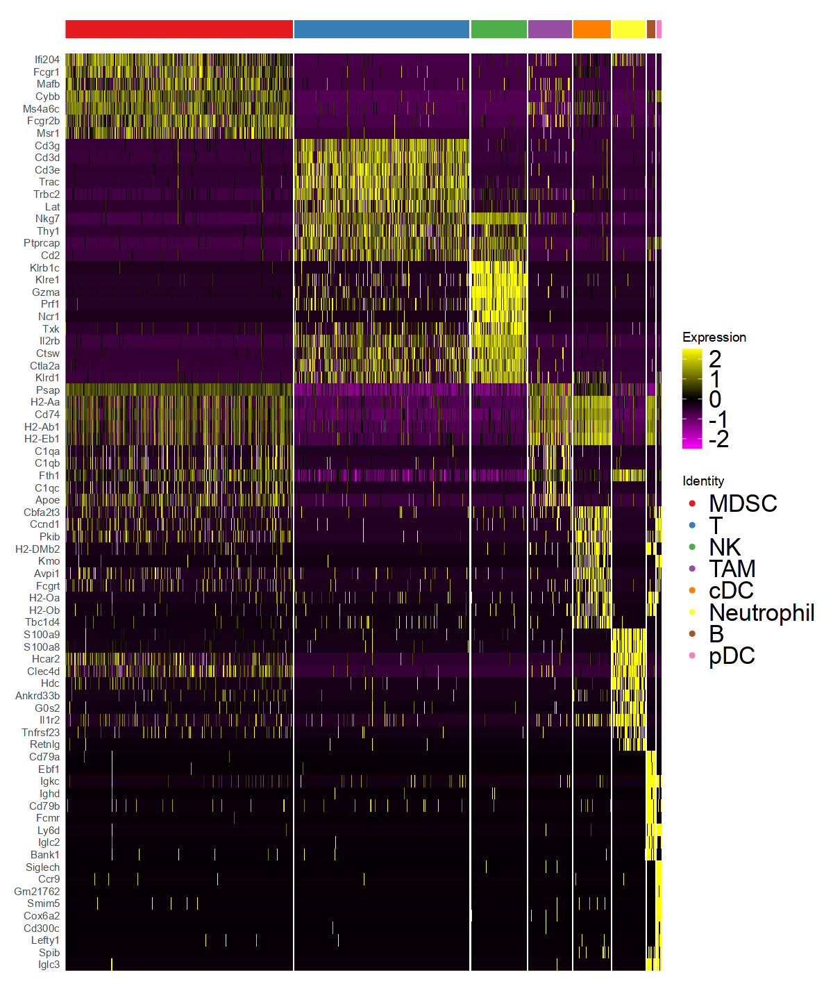

In [50]:
options(repr.plot.width = 10, repr.plot.height = 12)
fig1 <- DoHeatmap(merged, features = top_markers_aggregate$gene,
                  slot='scale.data',
                  angle = 90, size=30,label=FALSE,
                  group.colors = cluster_colors)+
theme(legend.text = element_text(size = 20))

fig1

ggsave(file.path(dir_fig,"01_annotation_heatmap.jpeg"), plot = fig1, width = 10, height = 12, dpi = 300)
ggsave(file.path(dir_fig,"01_annotation_heatmap.pdf"), plot = fig1, width = 10, height = 12, dpi = 300)

In [186]:
ggsave(file.path(dir_fig,"01_annotation_heatmap.jpeg"), plot = fig1, width = 10, height = 12, dpi = 1200)
ggsave(file.path(dir_fig,"01_annotation_heatmap.pdf"), plot = fig1, width = 10, height = 12, dpi = 1200)

## Fig. b

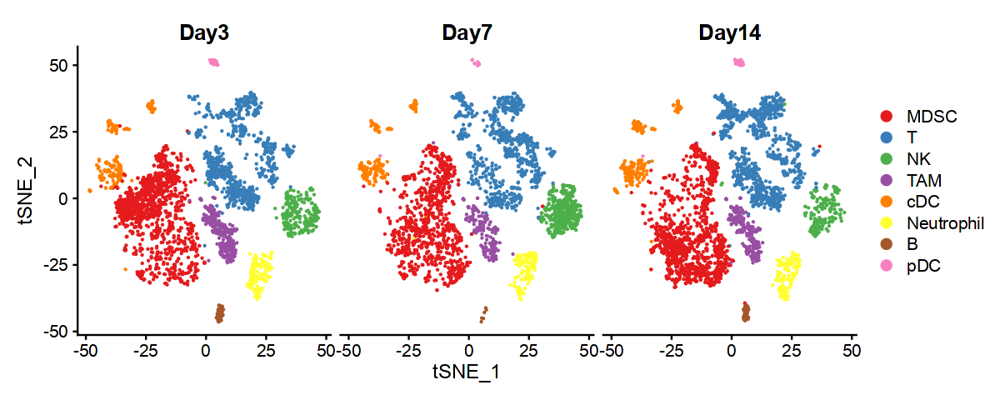

In [51]:
options(repr.plot.width = 10, repr.plot.height = 4)
fig2 <- DimPlot(merged, reduction = "tsne", label = FALSE, split.by='day') + 
theme(strip.text = element_text(size = 15)) + scale_color_brewer(palette = "Set1")
# theme(legend.text = element_text(size = 25), strip.text = element_blank())
fig2

ggsave(file.path(dir_fig,"02_overall_tsne.jpeg"), plot = fig2, width = 10, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"02_overall_tsne.pdf"), plot = fig2, width = 10, height = 4, dpi = 300)

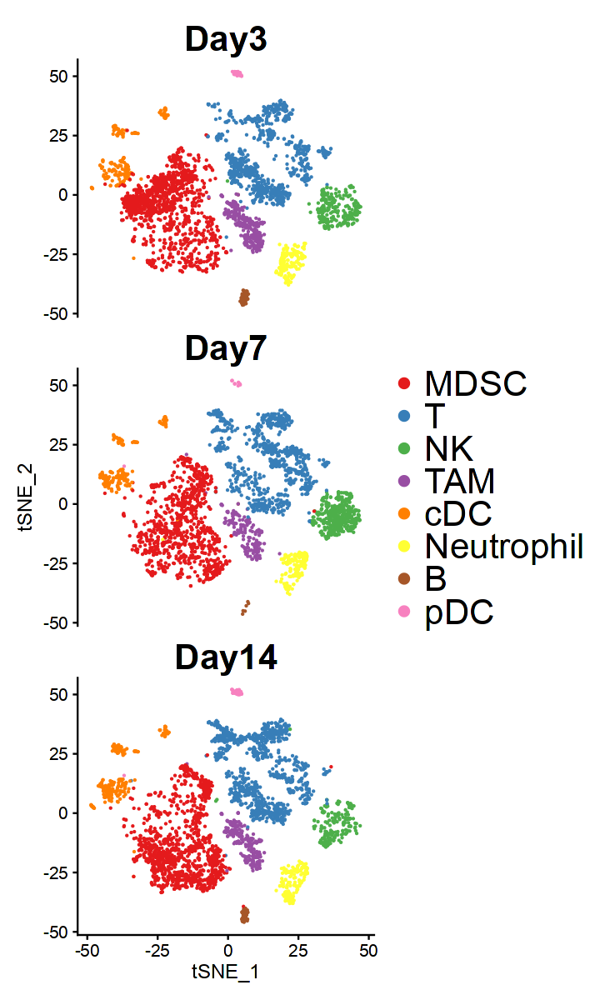

In [52]:
options(repr.plot.width = 6, repr.plot.height = 10)
fig2 <- DimPlot(merged, reduction = "tsne", label = FALSE, split.by='day', ncol=1) + 
theme(legend.text = element_text(size = 25), strip.text = element_text(size = 25))+
scale_color_brewer(palette = "Set1")

fig2

ggsave(file.path(dir_fig,"02_overall_tsne_v.jpeg"), plot = fig2, width = 6, height = 10, dpi = 300)
ggsave(file.path(dir_fig,"02_overall_tsne_v.pdf"), plot = fig2, width = 6, height = 10, dpi = 300)

Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


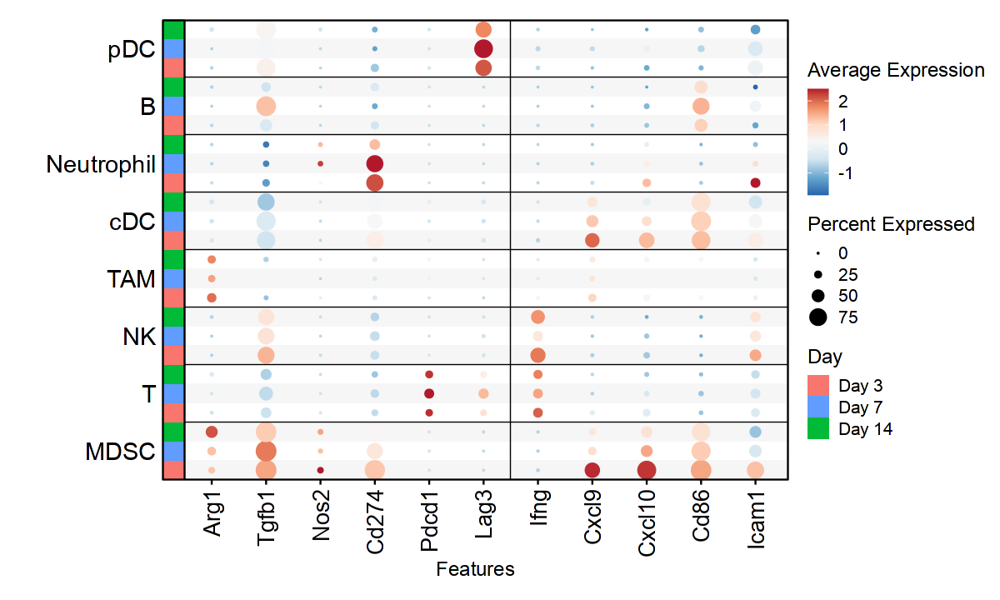

In [53]:
options(repr.plot.width = 10, repr.plot.height = 6)

# can use a RColorBrewer pallete, I chose RdBu here
cluster_specific_genes2 <- c(
    "Arg1", "Tgfb1", "Nos2", "Cd274", "Pdcd1", "Lag3",
    "Ifng", "Cxcl9", "Cxcl10", "Cd86", "Icam1")

cluster_genes <- cluster_specific_genes2
n_clusters  <- 8                 
n_days      <- 3                 # Day3, Day7, Day14
total_rows  <- n_clusters * n_days

v_lines <- c(6.5)
# Horizontal separators between clusters (every 3 rows)
h_lines <- seq(n_days + 0.5, total_rows, by = n_days)
# Empty y-axis labels (we’ll replace visually with tiles)
new_labels <- rep(c("", "", ""), times = n_clusters)
# Midpoints of each cluster block for big cluster labels (0–4)
cluster_midpoints <- seq(from = n_days/2 + 0.5, by = n_days, length.out = n_clusters)
# Alternating stripe background (odd rows)
stripe <- data.frame(
  ymin = seq(0.5, total_rows-1,     by = 2),
  ymax = seq(1.5, total_rows, by = 2)
)
# Day color tiles to the left (inside panel)
tile_df <- data.frame(
  y   = seq_len(total_rows),
  x   = 0.3,                                  # center x of the tile column
  day = factor(rep(c("3","7","14"), times = n_clusters), levels = c("3","7","14"))
)
# Color palette for Day legend
day_colors <- c("3"="#F8766D", "7"="#619CFF", "14"="#00BA38")

# 
outsideline = 0.5

# ============================================================
# Base DotPlot (Seurat -> ggplot)
# ============================================================
p <- DotPlot(merged, features = cluster_specific_genes2, cols = "RdBu", split.by='day')
# Put stripe background UNDER the dots by inserting the layer
stripe_layer <- geom_rect(
  data = stripe, inherit.aes = FALSE,
  aes(xmin = -Inf, xmax = Inf, ymin = ymin, ymax = ymax),
  fill = "grey90", alpha = 0.35
)
p$layers <- c(list(stripe_layer), p$layers) # insert as bottom-most layer

# ============================================================
# Styling, separators, and axis handling
# ============================================================
p2 <- p + labs(y = "Clusters")+
  theme(
    axis.text.x   = element_text(angle = 90, vjust = 0.5, hjust = 1, size = 16),
    axis.line.x   = element_blank(),
    axis.line.y   = element_blank(),
    axis.title.y  = element_text(
      angle = 90,          
      vjust = 5,         
      hjust = 05,         
      size  = 14,          
      face  = "bold",      
      margin = margin(r = 40)
    ),
    axis.ticks.y  = element_blank(),
    panel.border  = element_rect(color = "black", fill = NA, size = outsideline),
    plot.margin   = unit(c(1,1,1,4), "lines") # extra left margin for big labels if needed
  ) +
  # Cluster and 4-gene separators
  geom_vline(xintercept = v_lines, color = "black", linewidth = 0.3) +
  # Cluster and 4-gene separators
  geom_hline(yintercept = h_lines, color = "black", linewidth = 0.3) +
  # Allow drawing outside panel (for -Inf text if you later move it out)
  coord_cartesian(clip = "off")
# ============================================================
# Left-side cluster labels (big numbers)
# ============================================================
p2 <- p2 +
  annotate(
    "text",
    x        = -Inf,                 # left bound of the panel
    y        = cluster_midpoints,
    label    = c("MDSC ","T ","NK ", "TAM ", "cDC ","Neutrophil ","B ", "pDC "),
    hjust    = 1,                    # push a bit further left of the bound
    vjust    = 0.5,
    size     = 6,
    #fontface = "bold"
  )

# ============================================================
# Day tiles (act like colored y-axis labels) + pseudo y-axis line
# ============================================================
p2 <- p2 +
  geom_tile(
    data = tile_df, inherit.aes = FALSE,
    aes(x = x, y = y, fill = day),
    width = 0.4, height = 1
  ) +  
  # Day legend (fixed order 3 -> 7 -> 14)
  scale_fill_manual(
    name   = "Day",
    values = day_colors,
    breaks = c("3","7","14"),
    labels = c("Day 3","Day 7","Day 14")
  )+
# Pseudo y-axis line just to the right edge of the tiles
  scale_y_discrete(labels = new_labels, expand = c(0, 0))+
  geom_vline(xintercept = 0.5, color = "black", linewidth = outsideline)
# Remove y-axis text (replaced by tiles)

p2
ggsave(file.path(dir_fig,"03_immune_marker.jpeg"), plot = p2, width = 10, height = 6, dpi = 300)
ggsave(file.path(dir_fig,"03_immune_marker.pdf"), plot = p2, width = 10, height = 6, dpi = 300)

## Fig. c MDSC marker

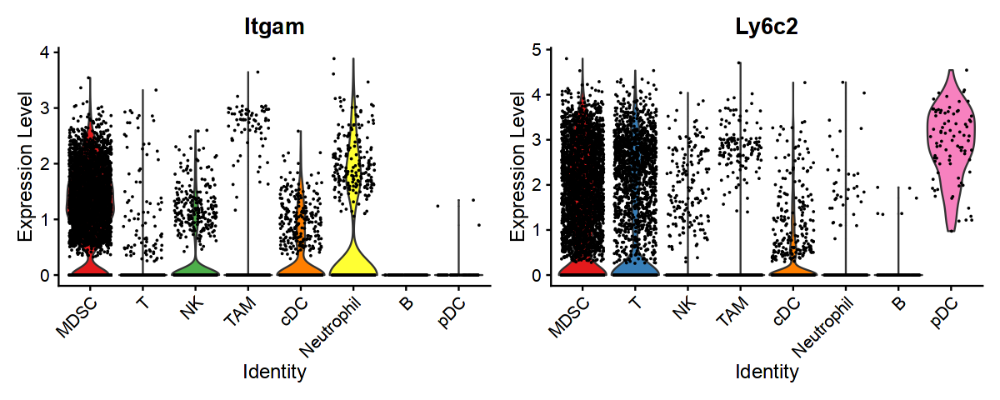

In [55]:
cluster_specific_genes2 <- c("Itgam", "Ly6c2")
options(repr.plot.width = 10,repr.plot.height = 4)
p3_2 <- VlnPlot(merged, features = cluster_specific_genes2, ncol=2, pt.size=0.01, cols = cluster_colors)
p3_2

ggsave(file.path(dir_fig,"04_MDSC_marker.jpeg"), plot = p3_2, width = 10, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"04_MDSC_marker.pdf"), plot = p3_2, width = 10, height = 4, dpi = 300)

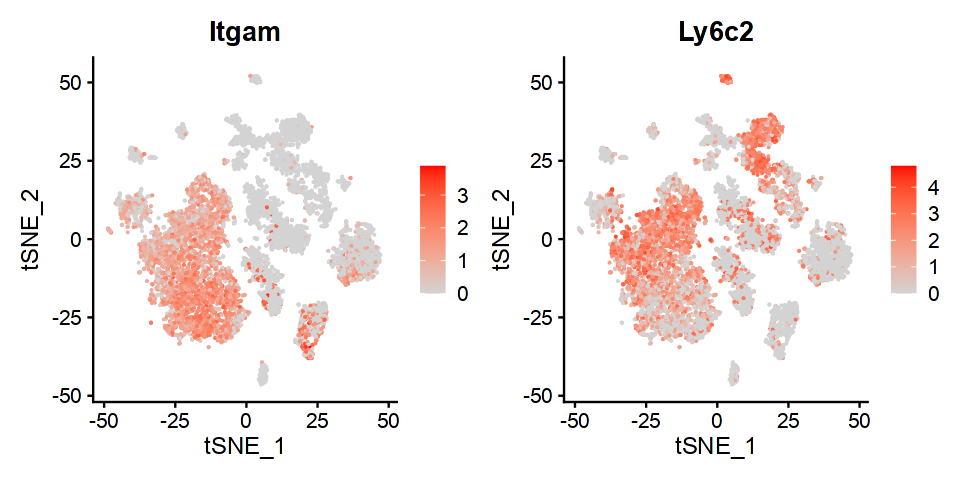

In [56]:
cluster_specific_genes1 <- c("Itgam", "Ly6c2")

options(repr.plot.width = 8,repr.plot.height = 4)
p3 <- FeaturePlot(merged, features = cluster_specific_genes1, reduction = "tsne", pt.size=0.1, ncol=2, cols = c("lightgrey", "red"))
p3

ggsave(file.path(dir_fig,"04_MDSC_feature.jpeg"), plot = p3, width = 8, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"04_MDSC_feature.pdf"), plot = p3, width = 8, height = 4, dpi = 300)

## Fig. MDSC immunosuppressive marker

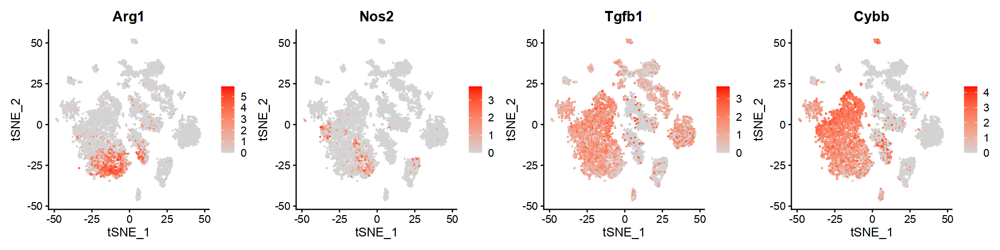

In [57]:
cluster_specific_genes1 <- c("Arg1", "Nos2", "Tgfb1", "Cybb")

options(repr.plot.width = 16,repr.plot.height = 4)
p4 <- FeaturePlot(merged, features = cluster_specific_genes1, reduction = "tsne", pt.size=0.1, ncol=4, cols = c("lightgrey", "red"))
p4

ggsave(file.path(dir_fig,"05_sup_marker_feature.jpeg"), plot = p4, width = 16, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"05_sup_marker_feature.pdf"), plot = p4, width = 16, height = 4, dpi = 300)

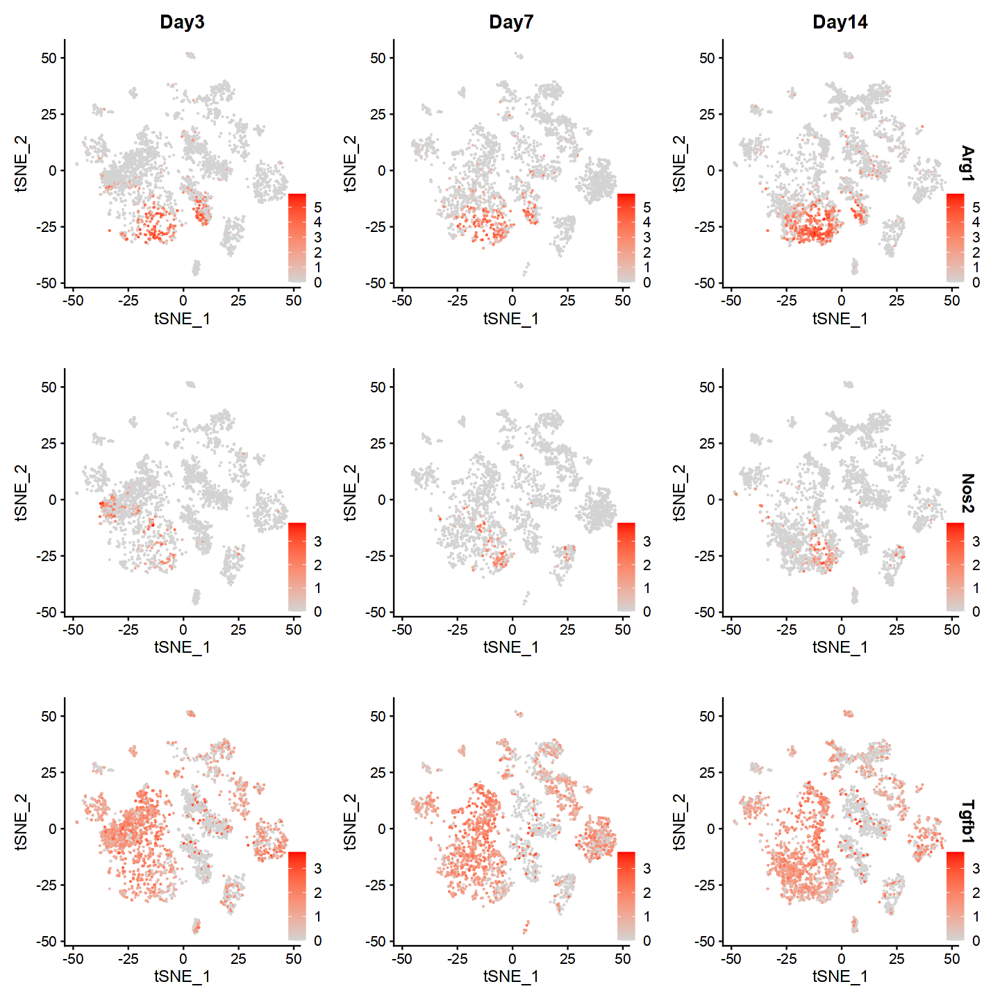

In [61]:
cluster_specific_genes1 <- c("Arg1", "Nos2", "Tgfb1")

options(repr.plot.width = 12,repr.plot.height = 12)
FeaturePlot(merged, features = cluster_specific_genes1, reduction = "tsne", pt.size=0.1, ncol=3,
            cols = c("lightgrey", "red"), split.by='day')&theme(legend.position = c(0.95,0.2))

# 7. Additional Analysis

In [63]:
plot_proportions <- function (seuratobj){
  proportions <- table(seuratobj@active.ident)/length(seuratobj@active.ident)*100
  proportions <- as.data.frame(proportions)
  ggplot(proportions , aes (x = Var1, y = Freq))+
    geom_bar(stat = "identity", aes(fill = Var1))+
    theme_classic()+
    labs (x = NULL, y = "Percent of total cells", title = "Cell abundance by cluster")+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12, color = "black"), 
          axis.text.y = element_text(size = 12, color = "black"),
          axis.title.y = element_text(size = 12),
          legend.position = "none")
}

get_group_proportions <- function (seuratobj, group.by = "active.ident") {
  if (group.by == "active.ident") {
    seuratobj[["active.ident"]] <- seuratobj@active.ident
  }
  # gets the total number of cells within each group
  total_populations <- seuratobj@meta.data %>% group_by(orig.ident) %>% summarize (total.pop = n())
  # gets the proportion of cells for each cell type within a group by dividing by the total
  count_populations <- seuratobj@meta.data %>% group_by_at(vars(group.by, "orig.ident")) %>% summarize (n = n())
  count_populations <- left_join(count_populations, total_populations, by = "orig.ident")
  count_populations <- count_populations %>% mutate (proportion = n/total.pop)
  count_populations
}

plot_group_proportions <- function (seuratobj, graph.type = "dodge") {
  # get the proportions using get_group_proportions()
  count_populations <- get_group_proportions(seuratobj)
  # plot the proportions
  if (graph.type == "dodge"){
  ggplot(count_populations, aes (x = active.ident, y = proportion))+
    geom_bar (aes(fill = orig.ident), stat = "identity", position = "dodge")+
      theme(axis.text.x = element_text(angle=45, hjust = 1))
  } else if (graph.type == "stacked") {
  ggplot(count_populations, aes (x = orig.ident, y = proportion))+
    geom_bar (aes(fill = active.ident), stat = "identity", position = "fill")
  }
  else
    print("invalid graph type")
}

In [64]:
get_group_proportions(merged)

Warning message:
“Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(group.by)

  # Now:
  data %>% select(all_of(group.by))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.”
`summarise()` has grouped output by 'active.ident'. You can override using the `.groups` argument.


active.ident,orig.ident,n,total.pop,proportion
<fct>,<chr>,<int>,<int>,<dbl>
MDSC,day03,1383,3354,0.412343470
MDSC,day07,994,2881,0.345019091
MDSC,day14,1318,3292,0.400364520
T,day03,911,3354,0.271615981
T,day07,881,2881,0.305796598
T,day14,1059,3292,0.321688943
NK,day03,257,3354,0.076624925
NK,day07,471,2881,0.163484901
NK,day14,183,3292,0.055589307


`summarise()` has grouped output by 'active.ident'. You can override using the `.groups` argument.


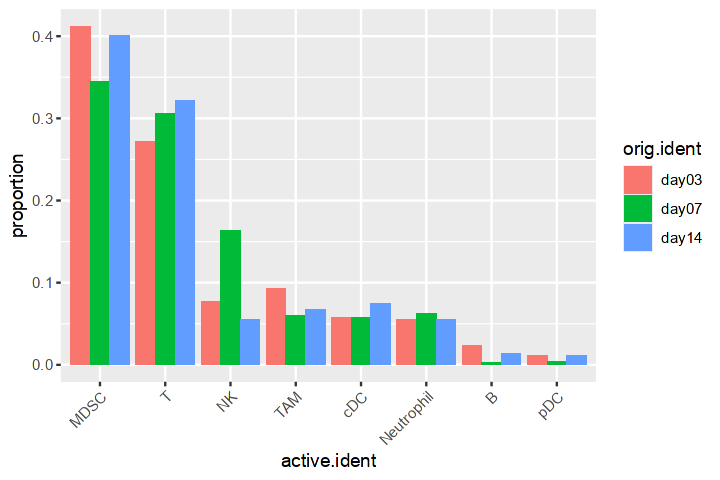

In [65]:
options(repr.plot.width = 6, repr.plot.height = 4)
plot_group_proportions(merged, graph.type = "dodge")

# Fig. MDSC immunostimulatory marker

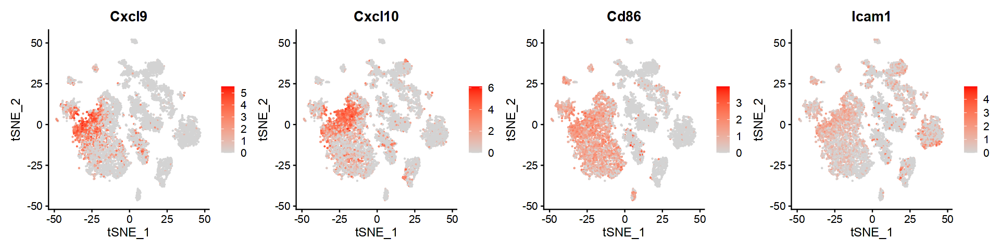

In [187]:
cluster_specific_genes1 <- c("Cxcl9", "Cxcl10","Cd86", "Icam1")

options(repr.plot.width = 16,repr.plot.height = 4)
p4 <- FeaturePlot(merged, features = cluster_specific_genes1, reduction = "tsne", pt.size=0.1, ncol=4, cols = c("lightgrey", "red"))
p4

ggsave(file.path(dir_fig,"06_act_marker_feature.jpeg"), plot = p4, width = 16, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"06_act_marker_feature.pdf"), plot = p4, width = 16, height = 4, dpi = 300)

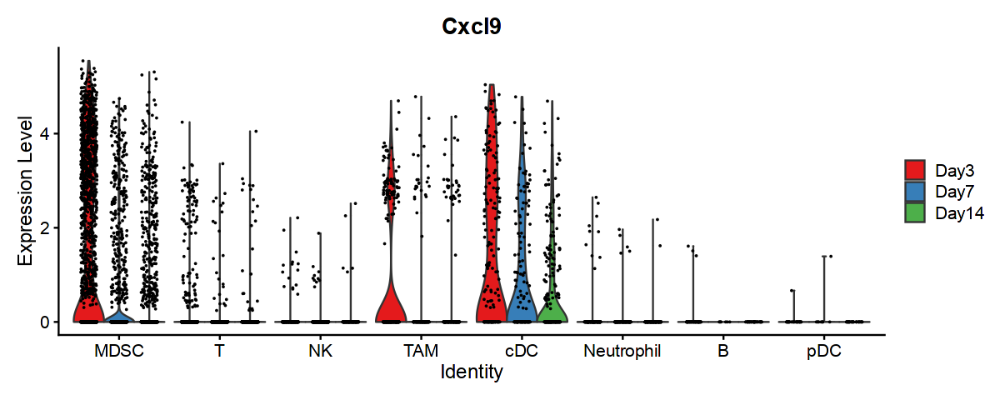

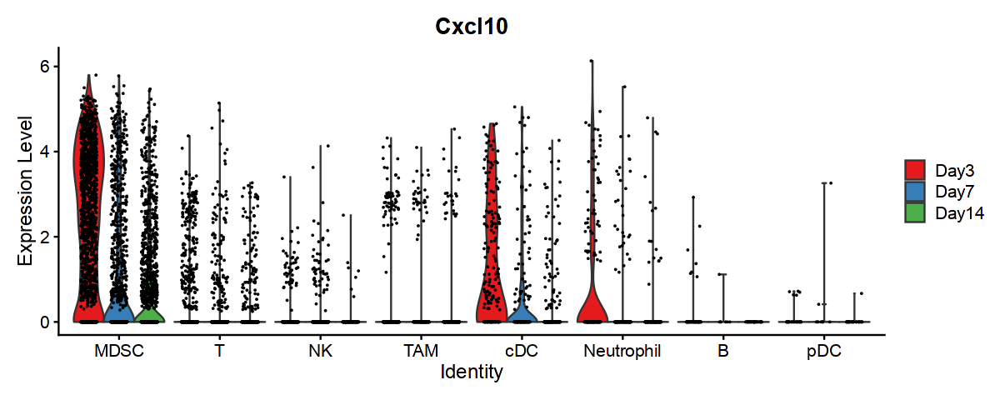

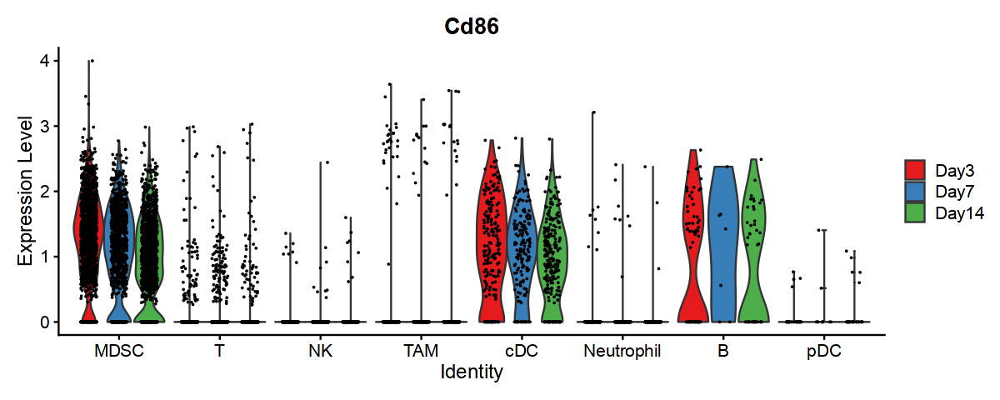

In [189]:
cluster_specific_genes1 <- c("Cxcl9")
options(repr.plot.width = 10,repr.plot.height = 4)
p3_1 <- VlnPlot(merged, features = cluster_specific_genes1, ncol=1, pt.size=0.01, cols = cluster_colors, split.by='day')+ 
theme(axis.text.x = element_text(angle = 0, hjust=0.5))
p3_1

cluster_specific_genes1 <- c("Cxcl10")
p3_2 <- VlnPlot(merged, features = cluster_specific_genes1, ncol=1, pt.size=0.01, cols = cluster_colors, split.by='day')+
theme(axis.text.x = element_text(angle = 0, hjust=0.5))

p3_2

cluster_specific_genes1 <- c("Cd86")
p3_3 <- VlnPlot(merged, features = cluster_specific_genes1, ncol=1, pt.size=0.01, cols = cluster_colors, split.by='day')+
theme(axis.text.x = element_text(angle = 0, hjust=0.5))
p3_3

ggsave(file.path(dir_fig,"S10_Vlnplot_feature1.pdf"), plot = p3_1, width = 10, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"S10_Vlnplot_feature2.pdf"), plot = p3_2, width = 10, height = 4, dpi = 300)
ggsave(file.path(dir_fig,"S10_Vlnplot_feature3.pdf"), plot = p3_3, width = 10, height = 4, dpi = 300)


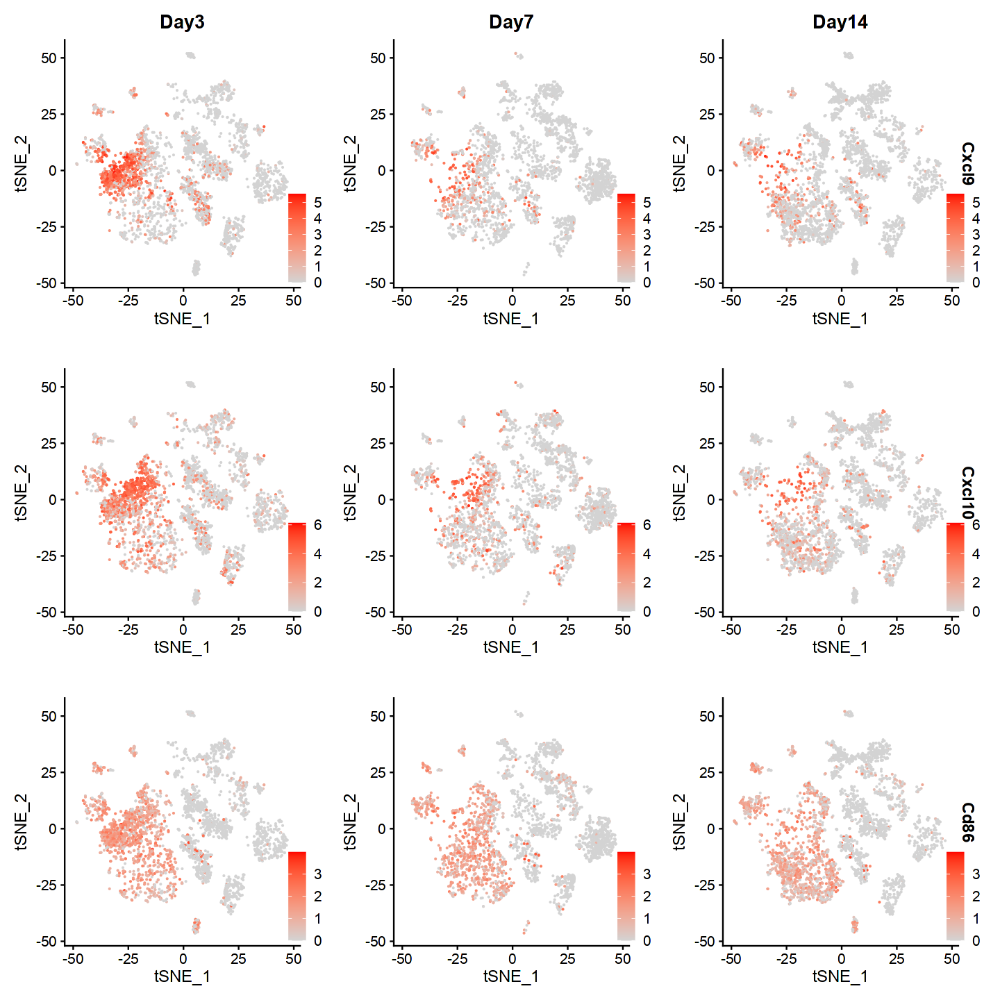

In [192]:
cluster_specific_genes1 <- c("Cxcl9", "Cxcl10", "Cd86")

options(repr.plot.width = 12,repr.plot.height = 12)
S10 <- FeaturePlot(merged, features = cluster_specific_genes1, reduction = "tsne", pt.size=0.1, ncol=3,
            cols = c("lightgrey", "red"), split.by='day')&theme(legend.position = c(0.95,0.2))
S10
ggsave(file.path(dir_fig,"S10_Vlnplot_feature0.pdf"), plot = S10, width = 12, height = 12, dpi = 300)